# SAOImageDS9 Demo


**Kenny Glotfelty**



[`ds9`](http://ds9.si.edu) is the standard data visualization used by professional and amateur Astronomers world-wide.



## Installation

This notebook was created with

In [1]:
ciaover | sed s,$ASCDS_INSTALL,/soft/ciao-4.11,

CIAO 4.11 Wednesday, December  5, 2018
  bindir      : /soft/ciao-4.11/bin
  CALDB       : 4.8.2


This notebook requires the `bash_kernel` to be installed.  With `CIAO 4.11` most users can now 

```bash
pip3 install bash_kernel
python -m bash_kernel.install --sys-prefix
```

Use the `kernelspec` command to check that it is installed properly 

In [2]:
jupyter kernelspec list |& sed s,$ASCDS_INSTALL,/soft/ciao-4.11,

Available kernels:
  bash       /soft/ciao-4.11/ots/share/jupyter/kernels/bash
  python3    /soft/ciao-4.11/ots/share/jupyter/kernels/python3
  python2    /usr/local/share/jupyter/kernels/python2


---
---

## Basics

`ds9` provides several ways the user can tweak the user interface to meet their personal preference.  These include

- Horizontal | Vertical
- Blink
- Tear Off Menus
- Shortcuts 
- Cuts, Colorbar, 


---

### Data


[ACT J0102-4915, OBS_ID 14022](http://cda.harvard.edu/srservices/ocatDetails.do?obsid=14022)
    

```bash
download_chandra_obsid 14022 evt2
```






---

### Customizingthe UI

In [3]:
(cd Basics; \
ds9 acisf14022N001_evt2.fits & \
)

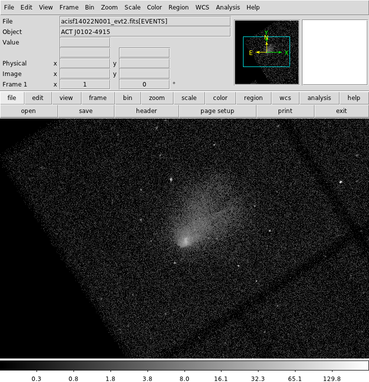

In [4]:
xpaset -p ds9 scale log
xpaset -p ds9 pan to 3760 4290 physical
xpaset -p ds9 bin factor 2

import -window 'SAOImage ds9' -resize 50% ds9_01_basics_01.png 
display < ds9_01_basics_01.png

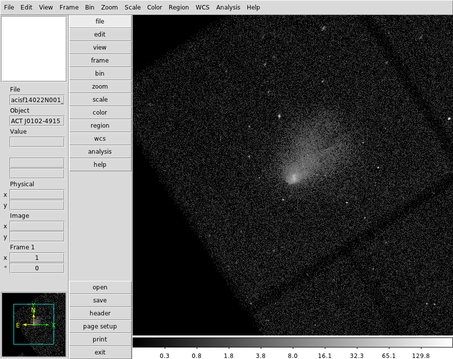

In [5]:
xpaset -p ds9 view vertical

import -window 'SAOImage ds9' -resize 50% ds9_01_basics_02.png 
display < ds9_01_basics_02.png

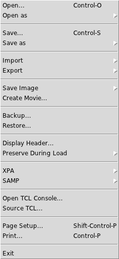

In [6]:
# File -> Tear Off
sleep 5

import -window "File" -resize 50% ds9_01_basics_03.png 
display < ds9_01_basics_03.png

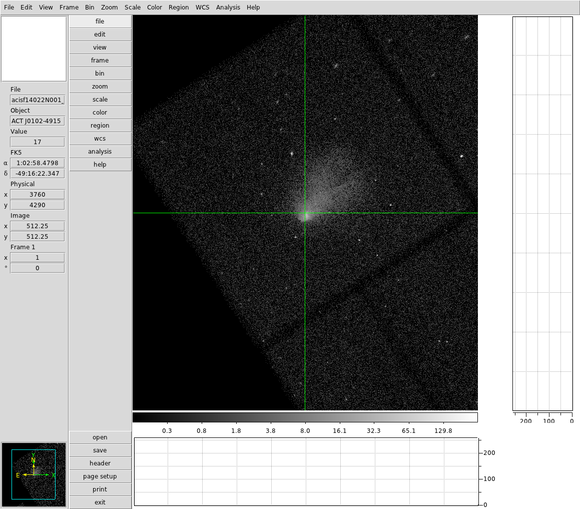

In [7]:
# Horizontal and Vertical graphs manually

sleep 5
xpaset -p ds9 crosshair 3760 4290 physical
#xpaset -p ds9 view graph horizontal yes
#xpaset -p ds9 view graph vertical yes
xpaset -p ds9 view horzgraph yes
xpaset -p ds9 view vertgraph yes



import -window 'SAOImage ds9' -resize 50% ds9_01_basics_04.png 
display < ds9_01_basics_04.png

---
---

## Bin, Block, Zoom

`ds9` works with both _FITS_ binary tables, ie Event files, as well as images.

When `ds9` reads an event file, it automatically bins the table into an image based on the _Bin_ parameters.

Users can _Zoom_ or _Block_ images.


---

### Bin

Only applies to Event files (tables).

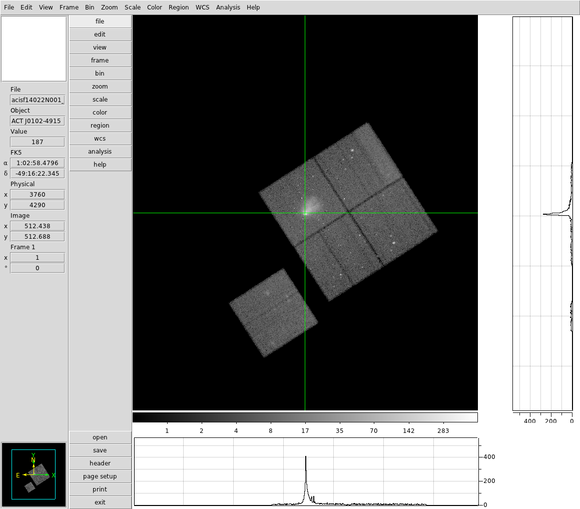

In [8]:
xpaset -p ds9 bin factor 8 

import -window "SAOImage ds9" -resize 50% ds9_02_bbz_01.png 
display < ds9_02_bbz_01.png

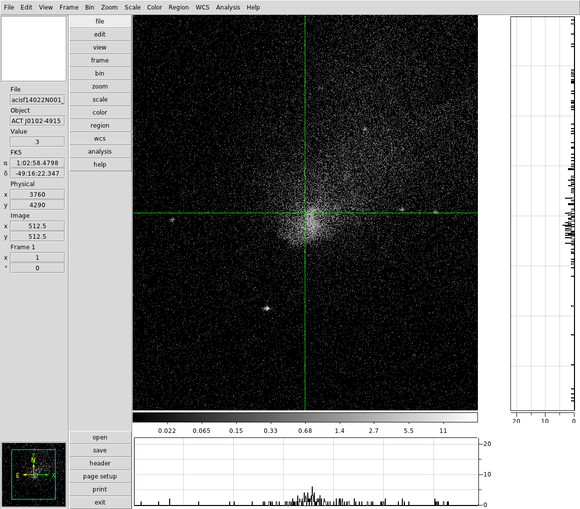

In [9]:
xpaset -p ds9 bin factor 0.5

import -window "SAOImage ds9" -resize 50% ds9_02_bbz_02.png 
display < ds9_02_bbz_02.png

---

### Zoom

Applies to image or table. Resamples image array, ie Zoom by 2, displays each row & column twice.  Zoom by 0.5 only displays every other row and column.


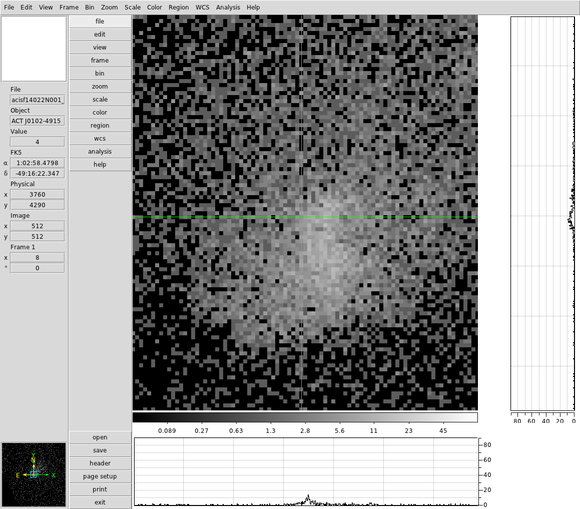

In [10]:
xpaset -p ds9 bin factor 1
xpaset -p ds9 zoom to 8

import -window "SAOImage ds9" -resize 50% ds9_02_bbz_03.png 
display < ds9_02_bbz_03.png

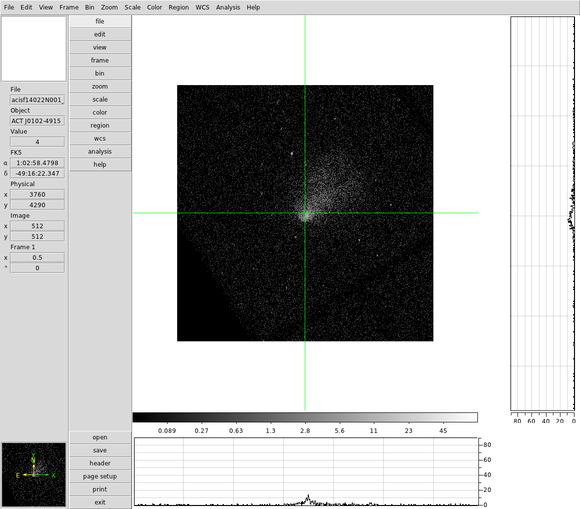

In [11]:
xpaset -p ds9 zoom to 0.5

import -window "SAOImage ds9" -resize 50% ds9_02_bbz_04.png 

display < ds9_02_bbz_04.png

---

### Block

Applies to images & tables. Combines pixel pixel values.

Block by 2, sums (or averages) pixels in 2x2 grid.  Block by 0.5 leaves 1-pixel gap between pixels.



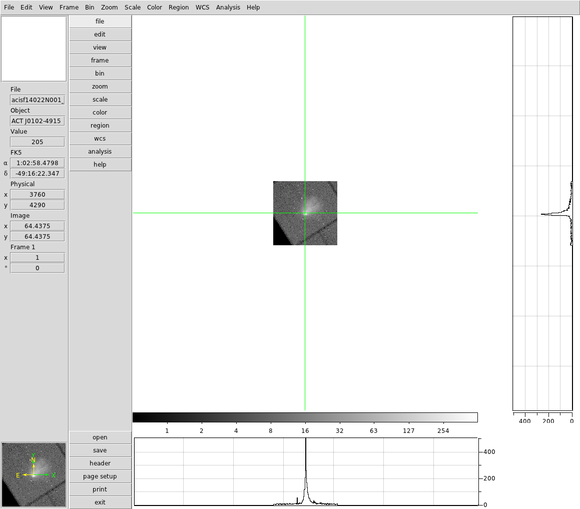

In [12]:
xpaset -p ds9 zoom to 1
xpaset -p ds9 block to 8

import -window "SAOImage ds9" -resize 50%  ds9_02_bbz_05.png 
display < ds9_02_bbz_05.png

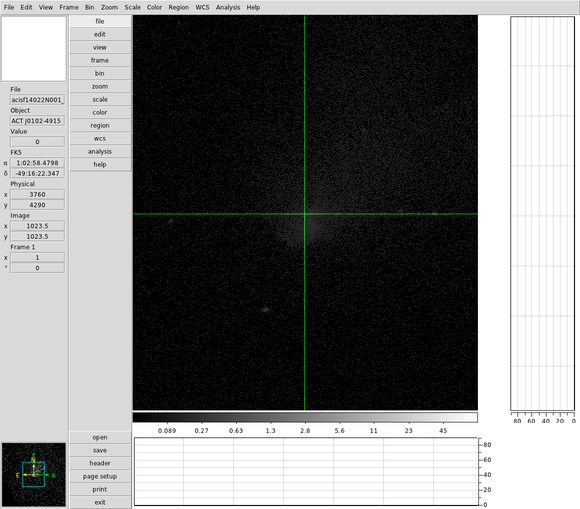

In [13]:
xpaset -p ds9 block to 0.5

import -window "SAOImage ds9" -resize 50% ds9_02_bbz_06.png 
display < ds9_02_bbz_06.png

In [14]:
xpaset -p ds9 quit

---
---


## Bin+Filter


`ds9` supports on-the-fly filtering of tables and images using the [funtools](https://github.com/ericmandel/funtools) filtering syntax.  It is the same as `CIAO` for simple filters; filters with complicated logic may be different.



### Data


[4U 1630-47, OBS_ID 19004](http://cda.harvard.edu/srservices/ocatDetails.do?obsid=19004)


```bash
download_chandra_obsid 19004 evt2
```

In [15]:
(cd Filter; \
ds9 acisf19004N001_evt2.fits  -scale log -bin to 4 & \
)

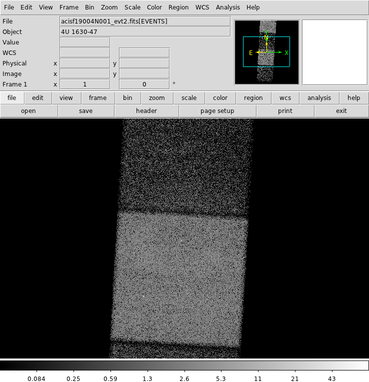

In [16]:
import -window "SAOImage ds9" -resize 50% ds9_03_filter_01.png 
display < ds9_03_filter_01.png

In [17]:
xpaset -p ds9 bin filter 'energy=2000:7000'

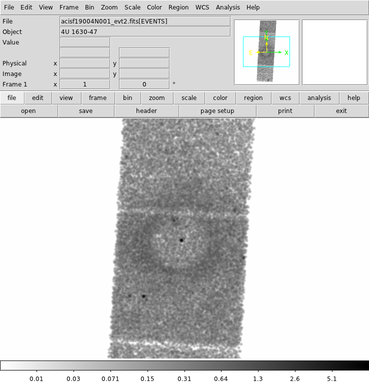

In [18]:
xpaset -p ds9 smooth yes
xpaset -p ds9 smooth radius 4
xpaset -p ds9 cmap grey
xpaset -p ds9 cmap invert

import -window "SAOImage ds9" -resize 50% ds9_03_filter_02.png 
display < ds9_03_filter_02.png

In [19]:
xpaset -p ds9 quit

---
---


## Regions

_Regions_ in `ds9` serve multiple purposes.  Some are purely decorative such as the `Text` and `Compass`.  Some are functional such as `Projection`, and some represent multiple analysis regions such as `Annulus` and `Panda`

> `Panda` = `Pie` `AND` `Annulus`

In this section we demonstrate a few of these

- Decorations
- Plot3D
- Statistics
- Projection

### Data

This data has been heavily processed to remove the point sources embedded in the extended emission.  The basic steps replicate the [An image of Diffuse Emission](http://cxc.harvard.edu/ciao/threads/diffuse_emission/index.html) thread.

The processing starts with c
luster [Abell401, OBS_ID 14024](http://cda.harvard.edu/srservices/ocatDetails.do?obsid=14024)



```bash
download_chandra_obsid 14024
chandra_repro 14024 out=repro
fluximage "14024/repro/acisf14024_repro_evt2.fits[ccd_id=0:3]" out=a401 bin=1 \
    band="0.500:3.000:1.4" psfecf=0.9
wavdetect infile='a401_0.500-3.000_thresh.img' outfile='wav.out' \
  scellfile='wav.cell' imagefile='wav.recon' defnbkgfile='wav.nbkg' \
  expfile='a401_0.500-3.000_thresh.expmap' \
  psffile='a401_0.500-3.000_thresh.psfmap' \
  scales='1.4 2 4 8 12 16'
roi infile=wav.out outsrcfile="srcfill/srcs_%04d.fits" group=indi \
  radiusmode=mul bkgradius=3 bkgfactor=2 bkgfunction=add targetbkg=target
splitroi @srcfill/srcs.lis points
dmfilth a401_0.500-3.000_thresh.img a401.img method="POISSON" \
    srclist="@points.src.reg" bkglist="@points.bg.reg" 
aconvolve a401.img a401_sm.img lib:'gaus(2,5,1,2,2)' meth=slide clob+
aconvolve a401_0.500-3.000_thresh.expmap a401_sm.exp lib:'gaus(2,5,1,2,2)' \
    meth=slide clob+
dmimgcalc a401_sm.img a401_sm.exp a401_sm.flux div clob+ 
dmimgthresh a401_sm.flux a401_sm_thresh.flux cut=5% \
  exp=a401_0.500-3.000_thresh.expmap value=0 clob+
```




---

### Decorations

> Remember, to create and manipulate regions, be sure you are in `Edit -> Region` mode.


In [20]:
( cd RegionDecoration;  \
ds9 a401_sm_thresh.flux -block 4 -scale linear -pan to 4205.73 4357.09 physical &  
)

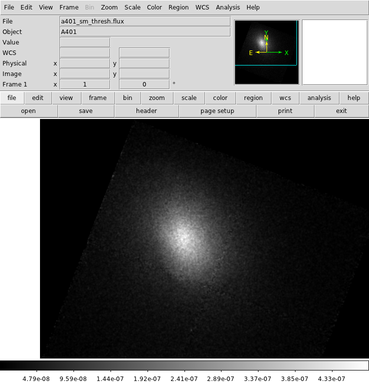

In [21]:
import -window "SAOImage ds9" -resize 50% ds9_04_regions_01.png 
display < ds9_04_regions_01.png

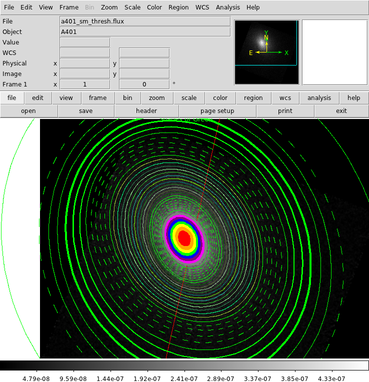

In [22]:
xpaset -p ds9 region load ds9.reg  

import -window "SAOImage ds9" -resize 50% ds9_04_regions_02.png 
display < ds9_04_regions_02.png

In [23]:
grep 'fill=1' RegionDecoration/ds9.reg

Ellipse(4205.73,4357.09,65.3328,47.5412,-69.2655) #  color=red fill=1
Ellipse(4206.72,4356.37,96.5828,69.6816,-67.0843) #  color=orange fill=1
Ellipse(4205.87,4355.63,121.583,88.7383,-65.0033) #  color=yellow fill=1
Ellipse(4205.41,4354.61,143.458,104.839,-65.6778) #  color=green fill=1
Ellipse(4205.12,4353.4,165.333,120.587,-65.4777) #   color=blue fill=1
Ellipse(4205.52,4351.85,185.645,134.127,-64.8471) #  color=purple fill=1
Ellipse(4206.81,4351.17,204.395,148.252,-63.8608) #  color=magenta fill=1
Ellipse(4208.95,4350.84,224.708,163.856,-62.6683) #  color=grey fill=1


In [24]:
grep 'darkgreen' --after-context=12 RegionDecoration/ds9.reg

Ellipse(4217.19,4352.56,388.77,280.943,-64.0236) #  color=darkgreen
Ellipse(4218.47,4353.69,412.208,298.867,-63.1396) #  color=darkolivegreen
Ellipse(4219.49,4355.47,434.083,317.69,-62.0701) #  color=darkseagreen
Ellipse(4220.27,4356.91,457.52,336.716,-61.5087) #  color=forestgreen
Ellipse(4221.08,4357.75,480.958,358.111,-60.6625) #  color=teal
Ellipse(4220.87,4359.08,505.958,380.527,-60.067) #  color=lawngreen
Ellipse(4220.9,4359.77,530.958,401.577,-59.6175) #  color=lightseagreen
Ellipse(4220.63,4360.33,559.083,425.075,-58.769) #  color=limegreen
Ellipse(4220.77,4360.28,587.208,448.562,-57.8081) # color=palegreen
Ellipse(4220.76,4359.89,615.333,474.052,-56.6615) # color=seagreen
Ellipse(4220.36,4359.74,646.583,500.295,-55.8772) # color=springgreen
Ellipse(4219.88,4359.3,680.958,526.823,-54.83) #  color=yellowgreen
Ellipse(4219.52,4357.85,715.333,556.473,-54.9205) #  text="Shades of Green"


In [25]:
grep 'width=.$' RegionDecoration/ds9.reg

Ellipse(4227.63,4322.95,971.583,806.68,-57.2076) #  width=2
Ellipse(4232.08,4308.8,1034.08,868.965,-58.151) #   width=3
Ellipse(4236.62,4293.31,1102.83,935.269,-59.6756) #  width=4


In [26]:
grep 'tag=' RegionDecoration/ds9.reg

Ellipse(4214.29,4351.05,345.802,247.916,-64.718) #  tag="Somewhere in the middle"
Ellipse(4215.82,4351.75,365.333,264.986,-63.849) #  tag="Somewhere in the middle" tag="Multiple Tags"
Ellipse(4269.46,4216.41,1715.33,1469.25,-61.3013) # tag="Outter Edge"


In [27]:
xpaset -p ds9 regions group "{Outter Edge}" color red  

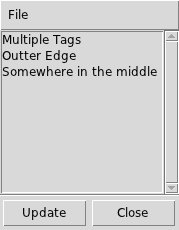

In [28]:
# Open Region -> Groups ...
sleep 3

import -window "Groups" ds9_04_regions_03.png 
display < ds9_04_regions_03.png

In [29]:
xpaset -p ds9 quit

---
---

### Region Functionality

Basic regions (circle, box, polygon, ellipse)  in `ds9` are also _functional_.

#### Data

This is a special dataset.  Before the iconic Chandra CasA first light, we had to be sure that the
instruments were still in focus.   The isolated point source _PKS0637-752_ was selected as the calibration target.
When the data were processed, there was something to the East of the source.  Soon thoughts of Hubble's blurry mirrors sprang to mind along with potential of software bugs.  Luckily, we found out that the smudge was coincident with a Radio jet -- and what we thought was a problem, was in fact Chandra's first scientific discovery of an unresolved X-ray jet.


[PKS0637-752 OBS_ID 62554](http://cda.harvard.edu/srservices/ocatDetails.do?obsid=62554)

```bash
download_chandra_obsid 62554 evt2
```


#### Live Statistics

In [30]:
( cd RegionFunctionality; 
ds9 acisf62554N003_evt2.fits -scale log -zoom 8 -pan to 3893 4038 physical & 
)

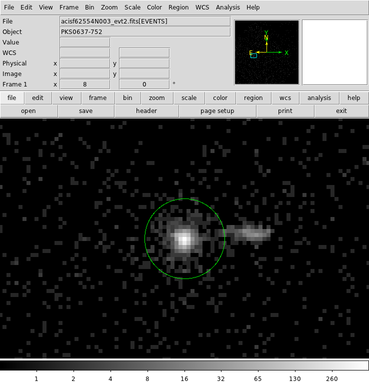

In [31]:
xpaset -p ds9 regions command "circle(3893,4038,10)"

import -window "SAOImage ds9" -resize 50% ds9_04_regions_03.png 
display < ds9_04_regions_03.png

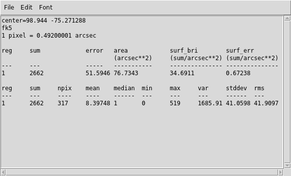

In [32]:
# Region -> Get Information
# Analysis -> Statistics
# Close Circle info box
sleep 5

import -window "Circle" -resize 50% ds9_04_regions_04.png 
display < ds9_04_regions_04.png

In [33]:
xpaset -p ds9 regions delete all

---

#### Projection Region

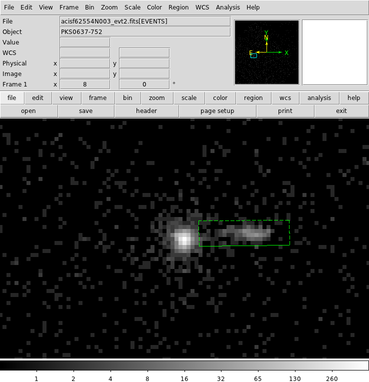

In [34]:
xpaset -p ds9 regions load ds9.reg 

import -window "SAOImage ds9" -resize 50% ds9_04_regions_05.png 
display < ds9_04_regions_05.png

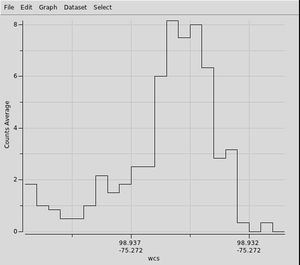

In [36]:
# Double Click Region, Analysis -> Plot2D
# close Projection info window
sleep 5

import -window "Projection" -resize 50% ds9_04_regions_06.png 
display < ds9_04_regions_06.png

In [37]:
xpaset -p ds9 quit

---

#### 3D Cube

`ds9` can also display higher-order datasets (>2).  The `cube` interface allows users to 
visualize slices through the data-cube; even _playing_ the slices and saving as a movie.

The basic regions can be used to explore the data along the 3rd axis.


##### Data

[RHO OPH CORE OBS_ID 635](http://cda.harvard.edu/srservices/ocatDetails.do?obsid=635)


```bash
download_chandra_obsid 635 evt2,fov

dmcopy "acisf00635N004_evt2.fits[sky=region(acisf00635_000N004_fov1.fits.gz)][bin sky=8,time=::#100]" time_cube.fits
```

This is a star forming region with many variable stars.

In [38]:
dmlist RegionFunctionality/time_cube.fits cols | grep "Axis#" --after-context=4

Group# Axis# 
   1   1,2    sky(x) = (+2791.0795) +(+8.0)* ((#1)-(+0.50))
                 (y)   (+2884.7055)  (+8.0)  ((#2) (+0.50))
   2   3      time                 = +72039163.853747 [s] +1019.7760 * (#3  -0.50)
 
--
Group# Axis# 
   1   1,2    EQPOS(RA ) = (+246.8247)[deg] +TAN[(-0.000136667)* (sky(x)-(+4096.50))]
                   (DEC)   (-24.5734 )           (+0.000136667)  (   (y) (+4096.50)) 


In [39]:
(cd RegionFunctionality;
ds9 time_cube.fits -scale log &
)

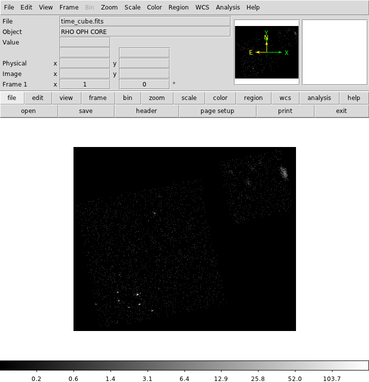

In [40]:
xpaset -p ds9 cube 80

import -window "SAOImage ds9" -resize 50% ds9_04_regions_07.png 
display < ds9_04_regions_07.png

In [41]:
xpaset -p ds9 regions command "circle(3811,3456,100)"

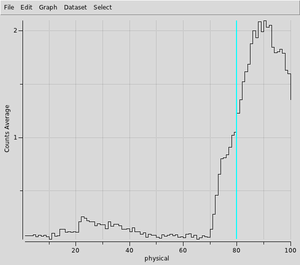

In [42]:
# Double click region, Plot 3D
# Close region info box
sleep 5

import -window "Circle" -resize 50% ds9_04_regions_08.png 
display < ds9_04_regions_08.png

In [43]:
xpaset -p ds9 quit

---
---


## RGB

One of the most useful analysis techniques is to view data at multiple wavelengths.

`ds9` makes this easy to do with it's 3-channel `RGB` (Red, Green, Blue) support.


### Data


```bash
download_chandra_obsid 13736
chandra_repro 13736 out=
fluximage 13736 out=./ bands=broad,csc bin=4 
dmimgadapt "broad_flux.img[sky=region(acisf13736_000N001_fov1.fits.gz)][opt full]" \
  outfile="broad_flux.asm" radfile="broad.radii" \
  function="gaussian" minrad="0.5" maxrad="45" numrad="100" radscale="linear" 
dmimgcalc broad_flux.asm none broad_flux.log exp="imgout=log(img1)"
```


#### Energy

In [44]:
(cd RGB;
ds9 -scale limits -8.5 -4 broad_flux.log &
)

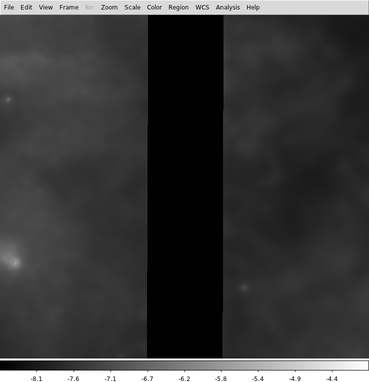

In [45]:
xpaset -p ds9 view info no
xpaset -p ds9 view buttons no
xpaset -p ds9 view panner no
xpaset -p ds9 view magnifier no

import -window "SAOImage ds9" -resize 50% ds9_05_rgb_01.png 
display < ds9_05_rgb_01.png

In [46]:
xpaset -p ds9 quit

---

#### Separate Files


```bash
for band in soft medium hard
do
  dmimgadapt "${band}_flux.img[sky=region(acisf13736_000N001_fov1.fits.gz)][opt full]" \
      outfile="${band}_flux.asm" inradfile="broad.radii" \
      function="gaussian" minrad="0.5" maxrad="45" numrad="100" radscale="linear" 
      
  dmimgcalc "${band}_flux.asm" none "${band}_flux.log" exp="imgout=log(img1)"
done
```



In [47]:
(cd RGB;
ds9 -scale limits -8.5 -4 -scale linear  \
  soft_flux.log -cmap load my_red.lut  \
  medium_flux.log -cmap load my_grn.lut  \
  hard_flux.log -cmap load my_blu.lut \
  -tile column &
)

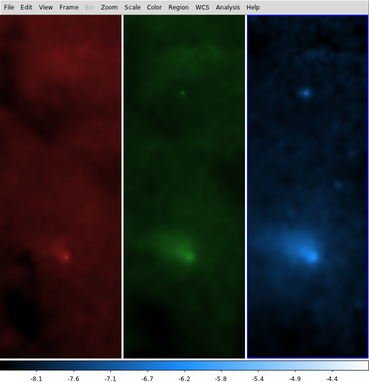

In [48]:
xpaset -p ds9 view info no
xpaset -p ds9 view buttons no
xpaset -p ds9 view panner no
xpaset -p ds9 view magnifier no

xpaset -p ds9 pan to 4086.5 4390.5 physical
xpaset -p ds9 match frame wcs

import -window "SAOImage ds9" -resize 50% ds9_05_rgb_02.png 
display < ds9_05_rgb_02.png

In [49]:
xpaset -p ds9 quit

In [50]:
(cd RGB;
ds9 -frame delete -rgb \
  -red   soft_flux.log -scale limits -8.5 -4 \
  -green medium_flux.log -scale limits -8.5 -4 \
  -blue  hard_flux.log  -scale limits -8.5 -4 & 
)

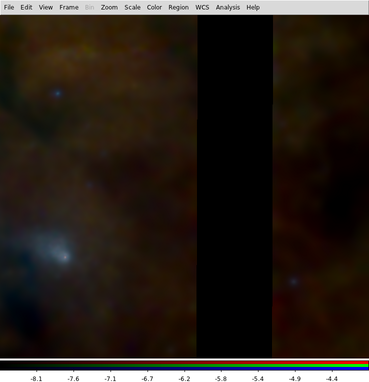

In [51]:
xpaset -p ds9 view info no
xpaset -p ds9 view buttons no
xpaset -p ds9 view panner no
xpaset -p ds9 view magnifier no
xpaset -p ds9 pan to 4586.5 4390.5 physical


import -window "SAOImage ds9" -resize 50% ds9_05_rgb_03.png 
display < ds9_05_rgb_03.png

In [52]:
xpaset -p ds9 quit

---

#### Time

[RHO OPH CORE OBS_ID 635](http://cda.harvard.edu/srservices/ocatDetails.do?obsid=635)


```bash
download_chandra_obsid 635 evt2
dmcopy "acisf00635N004_evt2.fits.gz[x=2800:6350,y=2890:5820][bin sky=6,time=::#3]" time.cube clob+
```


In [53]:
dmlist RGB/time.cube cols

 
--------------------------------------------------------------------------------
Columns for Image Block EVENTS_IMAGE
--------------------------------------------------------------------------------
 
ColNo  Name                 Unit        Type             Range
   1   EVENTS_IMAGE[592,489,3]              Int2(592x489x3) -                    
 
--------------------------------------------------------------------------------
Physical Axis Transforms for Image Block EVENTS_IMAGE
--------------------------------------------------------------------------------
 
Group# Axis# 
   1   1,2    sky(x) = (+2799.50) +(+6.0)* ((#1)-(+0.50))
                 (y)   (+2889.50)  (+6.0)  ((#2) (+0.50))
   2   3      time                 = +72039163.853747 [s] +33992.5334 * (#3  -0.50)
 
--------------------------------------------------------------------------------
World Coordinate Axis Transforms for Image Block EVENTS_IMAGE
-------------------------------------------------------------------------

In [54]:
(cd RGB;
ds9 -frame delete -scale log -rgbcube time.cube &
)

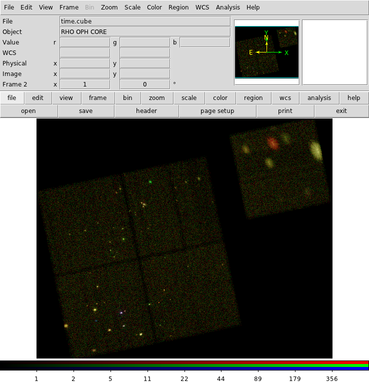

In [55]:
import -window "SAOImage ds9" -resize 50% ds9_05_rgb_04.png 
display < ds9_05_rgb_04.png

In [56]:
xpaset -p ds9 quit

---
---

## Colormaps

Custom colormaps can be a useful tool to quickly draw attention to parts
of an image.



### Data

This is a merged dataset for _IGR J14003-6326_, aka _G310.6-1.6_. 


```bash
find_chandra_obsid 'IGR J14003-6326' download=all
merge_obs "*/primary/*evt*" outroot=myfile bin=1 

```


In [57]:
(cd LUT;
ds9 G310.6-1.6.evt -pan to 4096.5 4096.5 -bin factor 1 -scale log -smooth yes &
)

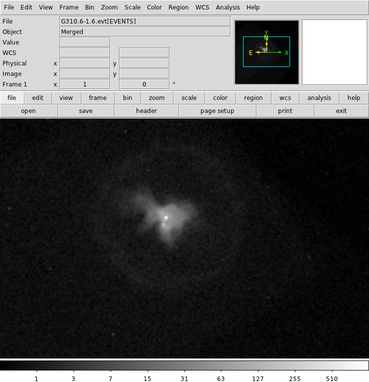

In [58]:
import -window "SAOImage ds9" -resize 50% ds9_06_lut_01.png 
display < ds9_06_lut_01.png

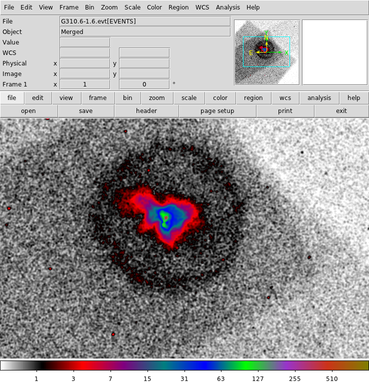

In [59]:
xpaset -p ds9 cmap load $ASCDS_INSTALL/contrib/data/vt2.lut 

import -window "SAOImage ds9" -resize 50% ds9_06_lut_02.png 
display < ds9_06_lut_02.png

In [60]:
xpaset -p ds9 quit

---
---


## Backup & Restore

### Data

You didn't think you would get through a Chandra/CIAO demo without seeing CasA, did you?

You have already seen this image before in the Introduction to X-ray Talk (or a version of it).  What if you 
needed to tweak the image for publication?  You can _Backup_ the state of `ds9` and _Restore_ it later.

> _Restore_ is not guaranteed to be back compatible.

If you want to make your own

[Cassiopeia A OBS_ID 4638](http://cda.harvard.edu/srservices/ocatDetails.do?obsid=4638)


```bash
download_chandra_obsid 4638 evt2
dmcopy acisf04638N003_evt2.fits"[x=3580.5:5072.5,y=3148.5:4640.5]" crop.evt

dmcopy "crop.evt[bin sky=4][energy=0:200]" outfile="0-p" 
dmcopy "crop.evt[bin sky=4][energy=200:500]" outfile="1-r"
dmcopy "crop.evt[bin sky=4][energy=500:850]" outfile="2-o"
dmcopy "crop.evt[bin sky=4][energy=850:1000]" outfile="3-y"
dmcopy "crop.evt[bin sky=4][energy=1000:1200]" outfile="4-g"
dmcopy "crop.evt[bin sky=4][energy=1200:2000]" outfile="5-b"
dmcopy "crop.evt[bin sky=4][energy=2000:3500]" outfile="6-i"
dmcopy "crop.evt[bin sky=4][energy=3500:7000]" outfile="7-v"
dmcopy "crop.evt[bin sky=4][energy=7000:10000]" outfile="8-k"
```





In [61]:
(cd BackupRestore;
/bin/ls -lRF | sed -e s,$USER,user, -e s,$GROUP,group, ;
)

.:
total 40
-rw-rw-r--  1 user group 35186 Dec 20 08:23 ds9.bck
drwxrwsr-x 11 user group  4096 Dec 20 08:23 ds9.bck.dir/

./ds9.bck.dir:
total 108
-rw-rw-r-- 1 user group 6912 Dec 20 08:23 0_hotpink4.lut
-rw-rw-r-- 1 user group 6912 Dec 20 08:23 1_firebrick.lut
-rw-rw-r-- 1 user group 6912 Dec 20 08:23 2_darkorange.lut
-rw-rw-r-- 1 user group 6912 Dec 20 08:23 3_gold4.lut
-rw-rw-r-- 1 user group 6912 Dec 20 08:23 4_forestgreen.lut
-rw-rw-r-- 1 user group 6912 Dec 20 08:23 5_steelblue.lut
-rw-rw-r-- 1 user group 6912 Dec 20 08:23 6_mediumpurple4.lut
-rw-rw-r-- 1 user group 6912 Dec 20 08:23 7_orchid4.lut
-rw-rw-r-- 1 user group 6912 Dec 20 08:23 8_khaki4.lut
drwxrwsr-x 2 user group 4096 Dec 20 08:23 Frame1/
drwxrwsr-x 2 user group 4096 Dec 20 08:23 Frame2/
drwxrwsr-x 2 user group 4096 Dec 20 08:23 Frame3/
drwxrwsr-x 2 user group 4096 Dec 20 08:23 Frame4/
drwxrwsr-x 2 user group 4096 Dec 20 08:23 Frame5/
drwxrwsr-x 2 user group 4096 Dec 20 08:23 Frame6/
drwxrwsr-x 2 user group 4096 Dec 2

In [62]:
(cd BackupRestore;
ds9 -restore ds9.bck &
)

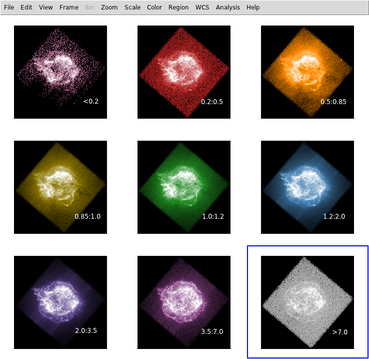

In [63]:
import -window "SAOImage ds9" -resize 50% ds9_07_backup_01.png 
display < ds9_07_backup_01.png

In [64]:
xpaset -p ds9 quit

---
---

## 3D Render

In addition to display 3D datasets one slice at a time, `ds9` can also render data cubes in 3D.


### Data


[ArLac, OBS_ID 13182](http://cda.harvard.edu/srservices/ocatDetails.do?obsid=13182)


```bash
download_chandra_obsid 13182 evt2
dmcopy "hrcf13182N002_evt2.fits[sky=circle(16404,16499,40)][bin chipx=7370:7857:1,chipy=7590:8080:1,time=::#100]" ar_lac.cube
```

Here we have filtered the _HRC_ event file on **sky** coordinates, but then binned the image into a 3D 
cube in **chip** coordinates vs. time.


In [65]:
(cd 3D;
ds9 -3d ar_lac.cube -scale log &
)

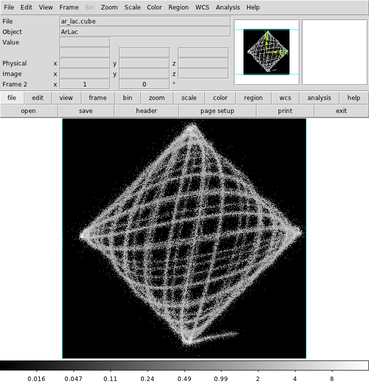

In [66]:
import -window "SAOImage ds9" -resize 50% ds9_08_3d_01.png 
display < ds9_08_3d_01.png 

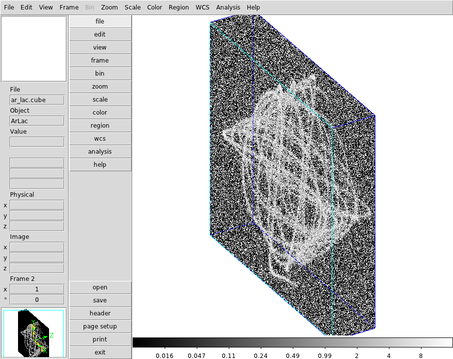

In [67]:
xpaset -p ds9 3d view 60 30
xpaset -p ds9 view vertical

import -window "SAOImage ds9" -resize 50% ds9_08_3d_02.png 
display < ds9_08_3d_02.png 

In [68]:
xpaset -p ds9 quit

---
---

## Contours


### Data


This example uses a data for Abell1664 created by merging 6 separate observations together.

```bash
download_chandra_obsid 1648,17172,17173,17557,17568,7901 
merge_obs infiles="1648,17172,17173,17557,17568,7901" outroot="a1664" bin=1 psfecf=0.9
dmcopy "a1664_broad_thresh.img[(x,y)=box(4117.7639,4017.2639,902.47226,769.1639,0)]" \
    "a1664_broad_thresh_crop.img"
celldetect a1664_broad_thresh_crop.img cell.src fixedcell=6
dmcopy "cell.src[exclude (x,y)=circle(4120,4010,25)]" ciao_reg.fits 
roi ciao_reg.fits out=%02d_reg.fits group=individual targetbkg=target mode=h clob+
/bin/ls ??_reg.fits | sed 's,.*,region(&),' > src.lis
/bin/ls ??_reg.fits | sed 's,.*,region(&[bkgreg]),' > bkg.lis
dmfilth infile="a1664_broad_thresh_crop.img" outfile="a1664_broad_thresh_crop_fill.img" \
    method="POISSON" srclist="@src.lis" bkglist="@bkg.lis"
```



In [69]:
(cd Contour;
ds9 a1664_broad_thresh_crop_fill.img  -cmap load $ASCDS_INSTALL/contrib/data/heart.lut \
  -scale asinh -smooth yes &
)

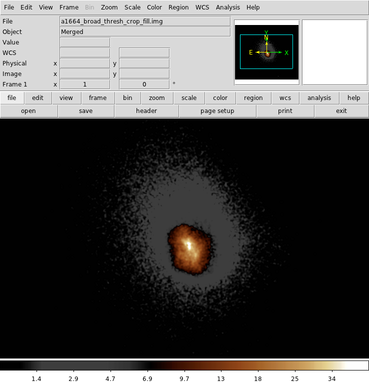

In [70]:
import -window "SAOImage ds9" -resize 50% ds9_09_contour_01.png
display < ds9_09_contour_01.png

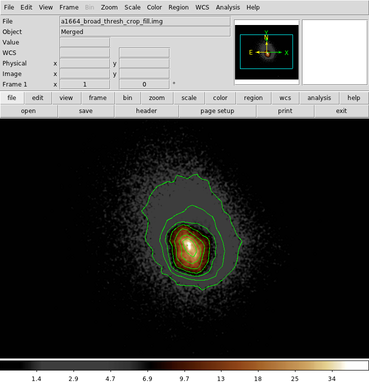

In [71]:
xpaset -p ds9 contour yes
xpaset -p ds9 contour nlevels 10
xpaset -p ds9 contour scale asinh
xpaset -p ds9 contour smooth 10
xpaset -p ds9 contour generate

import -window "SAOImage ds9" -resize 50% ds9_09_contour_02.png
display < ds9_09_contour_02.png

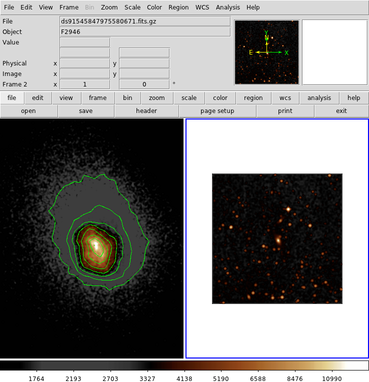

In [72]:
xpaset -p ds9 dsssao open
xpaset -p ds9 dsssao frame new
xpaset -p ds9 dsssao update frame

# move DSS window
sleep 5

import -window "SAOImage ds9" -resize 50% ds9_09_contour_03.png
display < ds9_09_contour_03.png

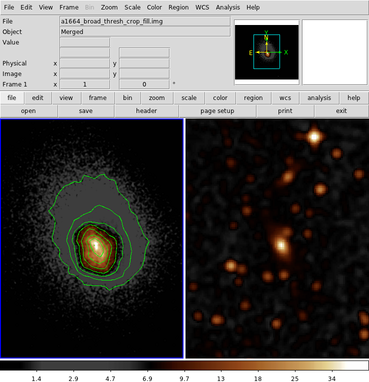

In [73]:
xpaset -p ds9 frame 1
xpaset -p ds9 match frame wcs

import -window "SAOImage ds9" -resize 50% ds9_09_contour_04.png
display < ds9_09_contour_04.png

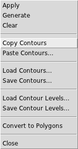

In [74]:
# grab contour File menu
sleep 3
import -window "File" -resize 50% ds9_09_contour_05.png
display < ds9_09_contour_05.png


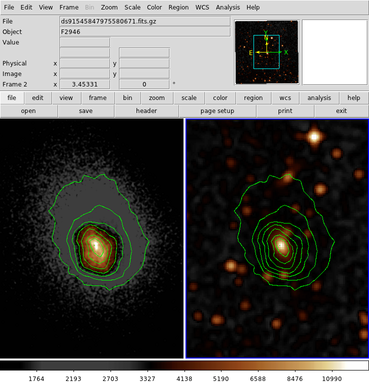

In [75]:
xpaset -p ds9 contour copy
xpaset -p ds9 frame 2
xpaset -p ds9 contour paste 

import -window "SAOImage ds9" -resize 50% ds9_09_contour_06.png
display < ds9_09_contour_06.png

In [76]:
xpaset -p ds9 quit

---
---

## Catalogs





### Data

[ORION NEBULA CLUSTER, OBS_ID 4396](http://cda.harvard.edu/srservices/ocatDetails.do?obsid=4396)


```bash
obsid_search_csc 4396 4396.tsv col='o.ks_prob_b,o.photflux_aper_b,o.cnts_aper_b'  clob+
download_chandra_obsid 4396 evt2
```

In [77]:
(cd Catalog;
ds9 acisf04396N003_evt2.fits -catalog import tsv 4396.tsv &
)

In [ ]:
# 
# Click Plot button
#   X-Axis:  cnts_aper_b
#   Y-Axis:  photflux_aper_b
#
xpaset -p ds9 catalog plot 'cnts_aper_b ' , '{$photflux_aper_b}' 

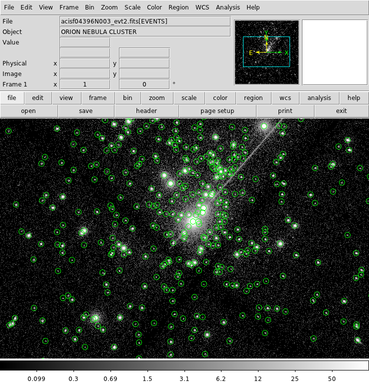

In [78]:
xpaset -p ds9 scale log
xpaset -p ds9 scale limits 0 100

import -window "SAOImage ds9" -resize 50% ds9_10_cat_01.png
display < ds9_10_cat_01.png 

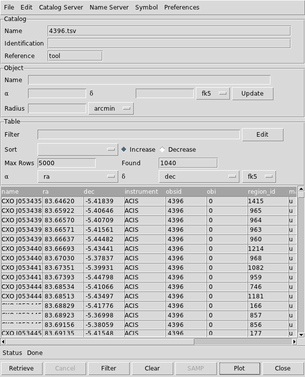

In [79]:
# Grab catalog window

sleep 3
import  -resize 50% ds9_10_cat_02.png 
display < ds9_10_cat_02.png 

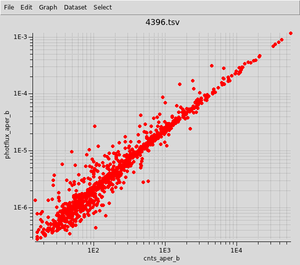

In [80]:
# Grab plot window

sleep 3
import -window "4396.tsv" -resize 50% ds9_10_cat_03.png 
display < ds9_10_cat_03.png 

### Symbols

In [81]:
xpaset -p ds9 catalog symbol load ds9.sym

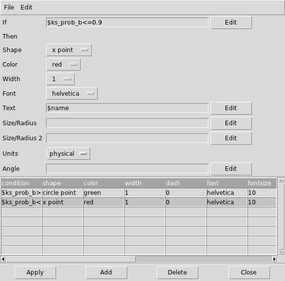

In [82]:
# Symbol -> Advanced
sleep 5

import -window "Symbol Editor" -resize 50% ds9_10_cat_04.png 
display < ds9_10_cat_04.png 

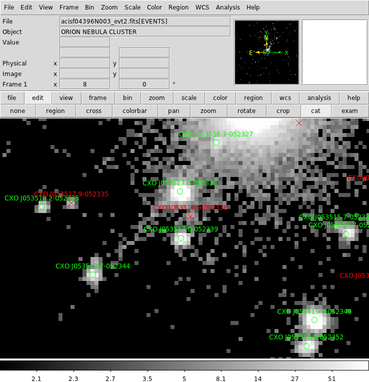

In [84]:
xpaset -p ds9 zoom to 8
xpaset -p ds9 scale limits 2 100

import -window "SAOImage ds9" -resize 50% ds9_10_cat_05.png 
display < ds9_10_cat_05.png 

In [85]:
xpaset -p ds9 quit

## Dax